In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/online-retail-ii-uci/online_retail_II.csv


In [2]:
import pandas as pd

df = pd.read_csv('/kaggle/input/online-retail-ii-uci/online_retail_II.csv')

print("Dataset Shape:", df.shape)
print("\nFirst 5 Rows:")
print(df.head())
print("\nData Types:")
print(df.dtypes)
print("\nMissing Values:")
print(df.isnull().sum())
print("\nBasic Statistics:")
print(df.describe())

Dataset Shape: (1067371, 8)

First 5 Rows:
  Invoice StockCode                          Description  Quantity  \
0  489434     85048  15CM CHRISTMAS GLASS BALL 20 LIGHTS        12   
1  489434    79323P                   PINK CHERRY LIGHTS        12   
2  489434    79323W                  WHITE CHERRY LIGHTS        12   
3  489434     22041         RECORD FRAME 7" SINGLE SIZE         48   
4  489434     21232       STRAWBERRY CERAMIC TRINKET BOX        24   

           InvoiceDate  Price  Customer ID         Country  
0  2009-12-01 07:45:00   6.95      13085.0  United Kingdom  
1  2009-12-01 07:45:00   6.75      13085.0  United Kingdom  
2  2009-12-01 07:45:00   6.75      13085.0  United Kingdom  
3  2009-12-01 07:45:00   2.10      13085.0  United Kingdom  
4  2009-12-01 07:45:00   1.25      13085.0  United Kingdom  

Data Types:
Invoice         object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
Price          float64
Customer ID    floa

In [3]:
import pandas as pd

df = pd.read_csv('/kaggle/input/online-retail-ii-uci/online_retail_II.csv')

df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

df.drop_duplicates(inplace=True)

df.dropna(subset=['Customer ID'], inplace=True)

df = df[~df['Invoice'].str.startswith('C')]

df = df[df['Quantity'] > 0]

df['TotalPrice'] = df['Quantity'] * df['Price']

print("Cleaned Shape:", df.shape)
print("\nFirst 5 Rows:")
print(df.head())
print("\nMissing Values After Cleaning:")
print(df.isnull().sum())
print("\nBasic Statistics After Cleaning:")
print(df.describe())

Cleaned Shape: (779495, 9)

First 5 Rows:
  Invoice StockCode                          Description  Quantity  \
0  489434     85048  15CM CHRISTMAS GLASS BALL 20 LIGHTS        12   
1  489434    79323P                   PINK CHERRY LIGHTS        12   
2  489434    79323W                  WHITE CHERRY LIGHTS        12   
3  489434     22041         RECORD FRAME 7" SINGLE SIZE         48   
4  489434     21232       STRAWBERRY CERAMIC TRINKET BOX        24   

          InvoiceDate  Price  Customer ID         Country  TotalPrice  
0 2009-12-01 07:45:00   6.95      13085.0  United Kingdom        83.4  
1 2009-12-01 07:45:00   6.75      13085.0  United Kingdom        81.0  
2 2009-12-01 07:45:00   6.75      13085.0  United Kingdom        81.0  
3 2009-12-01 07:45:00   2.10      13085.0  United Kingdom       100.8  
4 2009-12-01 07:45:00   1.25      13085.0  United Kingdom        30.0  

Missing Values After Cleaning:
Invoice        0
StockCode      0
Description    0
Quantity       0
Invoi

In [4]:
import pandas as pd
import plotly.express as px

df = pd.read_csv('/kaggle/input/online-retail-ii-uci/online_retail_II.csv')
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df.drop_duplicates(inplace=True)
df.dropna(subset=['Customer ID'], inplace=True)
df = df[~df['Invoice'].str.startswith('C')]
df = df[df['Quantity'] > 0]
df['TotalPrice'] = df['Quantity'] * df['Price']

top_countries = df.groupby('Country')['TotalPrice'].sum().sort_values(ascending=False).head(10).reset_index()
fig1 = px.bar(top_countries, x='Country', y='TotalPrice', title='Top 10 Countries by Total Sales',
              color='Country', color_discrete_sequence=px.colors.qualitative.Prism)
fig1.update_layout(xaxis_tickangle=-45, yaxis_title='Total Sales ($)', showlegend=False)
fig1.show()

fig2 = px.histogram(df, x='Quantity', nbins=50, title='Distribution of Quantity Ordered',
                    color_discrete_sequence=['#636EFA'], marginal='violin')
fig2.update_layout(yaxis_title='Count', xaxis_title='Quantity')
fig2.show()

df_filtered = df[df['Price'] < 50]
fig3 = px.histogram(df_filtered, x='Price', nbins=50, title='Distribution of Unit Price (Under $50)',
                    color_discrete_sequence=['#EF553B'], marginal='box')
fig3.update_layout(yaxis_title='Count', xaxis_title='Price ($)')
fig3.show()

In [5]:
import pandas as pd
import sqlite3

df = pd.read_csv('/kaggle/input/online-retail-ii-uci/online_retail_II.csv')
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df.drop_duplicates(inplace=True)
df.dropna(subset=['Customer ID'], inplace=True)
df = df[~df['Invoice'].str.startswith('C')]
df = df[df['Quantity'] > 0]
df['TotalPrice'] = df['Quantity'] * df['Price']

conn = sqlite3.connect('retail_db.db')

df.to_sql('Transactions', conn, if_exists='replace', index=False)

products = df[['StockCode', 'Description', 'Price']].drop_duplicates()
products.to_sql('Products', conn, if_exists='replace', index=False)

customers = df[['Customer ID', 'Country']].drop_duplicates()
customers.to_sql('Customers', conn, if_exists='replace', index=False)

test = pd.read_sql("SELECT * FROM Transactions LIMIT 5", conn)
print(test)

conn.close()

  Invoice StockCode                          Description  Quantity  \
0  489434     85048  15CM CHRISTMAS GLASS BALL 20 LIGHTS        12   
1  489434    79323P                   PINK CHERRY LIGHTS        12   
2  489434    79323W                  WHITE CHERRY LIGHTS        12   
3  489434     22041         RECORD FRAME 7" SINGLE SIZE         48   
4  489434     21232       STRAWBERRY CERAMIC TRINKET BOX        24   

           InvoiceDate  Price  Customer ID         Country  TotalPrice  
0  2009-12-01 07:45:00   6.95      13085.0  United Kingdom        83.4  
1  2009-12-01 07:45:00   6.75      13085.0  United Kingdom        81.0  
2  2009-12-01 07:45:00   6.75      13085.0  United Kingdom        81.0  
3  2009-12-01 07:45:00   2.10      13085.0  United Kingdom       100.8  
4  2009-12-01 07:45:00   1.25      13085.0  United Kingdom        30.0  


In [6]:
import pandas as pd
import sqlite3

conn = sqlite3.connect('retail_db.db')

rfm = pd.read_sql('''
SELECT
  "Customer ID" AS CustomerID,
  JULIANDAY((SELECT MAX(InvoiceDate) FROM Transactions)) - JULIANDAY(MAX(InvoiceDate)) AS Recency,
  COUNT(DISTINCT Invoice) AS Frequency,
  SUM(TotalPrice) AS Monetary
FROM Transactions
GROUP BY CustomerID
''', conn)

rfm['R_Score'] = pd.qcut(rfm['Recency'], 5, labels=[5,4,3,2,1])
rfm['F_Score'] = pd.qcut(rfm['Frequency'].rank(method='first'), 5, labels=[1,2,3,4,5])
rfm['M_Score'] = pd.qcut(rfm['Monetary'], 5, labels=[1,2,3,4,5])
rfm['RFM_Score'] = rfm['R_Score'].astype(str) + rfm['F_Score'].astype(str) + rfm['M_Score'].astype(str)

print(rfm.sort_values('Monetary', ascending=False).head(20))

conn.close()

      CustomerID     Recency  Frequency   Monetary R_Score F_Score M_Score  \
5695     18102.0    0.041667        145  580987.04       5       5       5   
2279     14646.0    1.026389        152  528602.52       5       5       5   
1791     14156.0    9.080556        156  313437.62       5       5       5   
2541     14911.0    0.872222        398  291420.81       5       5       5   
5053     17450.0    7.972917         51  244784.25       5       5       5   
1332     13694.0    3.137500        143  195640.69       5       5       5   
5112     17511.0    2.109722         60  172132.87       5       5       5   
4064     16446.0    0.149306          2  168472.50       5       2       5   
4298     16684.0    3.947222         55  147142.77       5       5       5   
68       12415.0   23.936111         28  144458.37       4       5       5   
2688     15061.0    3.030556        127  126389.02       5       5       5   
3650     16029.0   38.099306        107  117763.62       4      

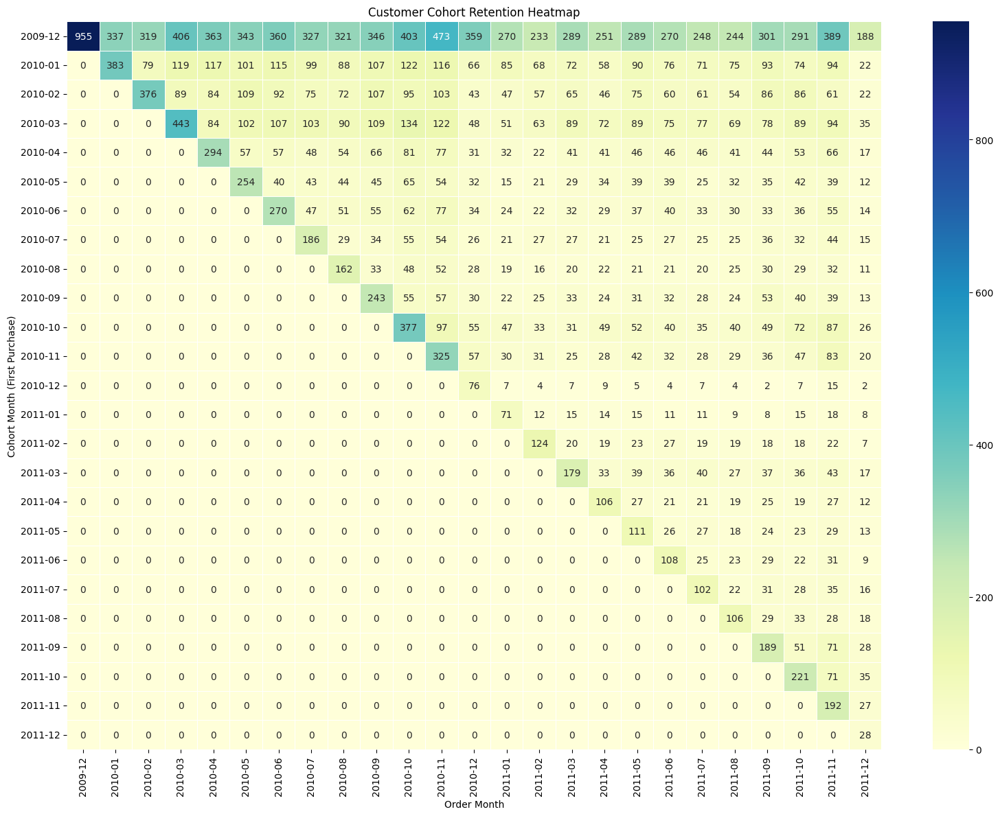

Cohort heatmap saved as cohort_heatmap.png


In [11]:
import pandas as pd
import sqlite3
import seaborn as sns
import matplotlib.pyplot as plt

conn = sqlite3.connect('retail_db.db')

cohort = pd.read_sql('''
WITH FirstPurchase AS (
  SELECT "Customer ID" AS CustomerID, MIN(strftime('%Y-%m', InvoiceDate)) AS CohortMonth
  FROM Transactions
  GROUP BY CustomerID
)
SELECT 
  f.CohortMonth,
  strftime('%Y-%m', t.InvoiceDate) AS OrderMonth,
  COUNT(DISTINCT t."Customer ID") AS ActiveCustomers
FROM Transactions t
JOIN FirstPurchase f ON t."Customer ID" = f.CustomerID
GROUP BY f.CohortMonth, OrderMonth
ORDER BY f.CohortMonth, OrderMonth
''', conn)

cohort_pivot = cohort.pivot(index='CohortMonth', columns='OrderMonth', values='ActiveCustomers').fillna(0)

plt.figure(figsize=(16,12))
sns.heatmap(cohort_pivot, annot=True, fmt='.0f', cmap='YlGnBu', linewidths=.5)
plt.title('Customer Cohort Retention Heatmap')
plt.ylabel('Cohort Month (First Purchase)')
plt.xlabel('Order Month')
plt.tight_layout()
plt.savefig('/kaggle/working/cohort_heatmap.png')
plt.show()

conn.close()

print("Cohort heatmap saved as cohort_heatmap.png")

In [12]:
import pandas as pd
import plotly.express as px

df = pd.read_csv('/kaggle/input/online-retail-ii-uci/online_retail_II.csv')
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df.drop_duplicates(inplace=True)
df.dropna(subset=['Customer ID'], inplace=True)
df = df[~df['Invoice'].str.startswith('C')]
df = df[df['Quantity'] > 0]
df['TotalPrice'] = df['Quantity'] * df['Price']
df['YearMonth'] = df['InvoiceDate'].dt.strftime('%Y-%m')

monthly_sales = df.groupby('YearMonth')['TotalPrice'].sum().reset_index()

fig = px.line(monthly_sales, x='YearMonth', y='TotalPrice', title='Monthly Sales Trend')
fig.update_layout(yaxis_title='Total Sales ($)', xaxis_title='Year-Month')
fig.write_html('/kaggle/working/monthly_sales_trend.html')
fig.show()

print("Monthly sales trend saved as monthly_sales_trend.html")

Monthly sales trend saved as monthly_sales_trend.html


In [15]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

df = pd.read_csv('/kaggle/input/online-retail-ii-uci/online_retail_II.csv')
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df.drop_duplicates(inplace=True)
df.dropna(subset=['Customer ID'], inplace=True)
df = df[~df['Invoice'].str.startswith('C')]
df = df[df['Quantity'] > 0]
df['TotalPrice'] = df['Quantity'] * df['Price']
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month
df['YearMonth'] = df['InvoiceDate'].dt.strftime('%Y-%m')
df['MonthName'] = df['InvoiceDate'].dt.strftime('%B')

fig = make_subplots(
    rows=3, cols=2,
    subplot_titles=(
        "📈 Monthly Sales Trend (Hover for details)",
        "🌍 Sales by Country (Click to filter)",
        "💰 Price Distribution (Most items cheap)",
        "📦 Quantity per Order (Most orders small)",
        "🏆 Top 10 Customers by Sales",
        "🗓️ Sales by Month (Seasonal peaks in November)"
    ),
    specs=[[{"type": "xy"}, {"type": "bar"}],
           [{"type": "histogram"}, {"type": "histogram"}],
           [{"type": "bar"}, {"type": "bar"}]]
)

monthly = df.groupby('YearMonth')['TotalPrice'].sum().reset_index()
fig.add_trace(go.Scatter(x=monthly['YearMonth'], y=monthly['TotalPrice'],
                         mode='lines+markers', name="Sales",
                         hovertemplate='Month: %{x}<br>Sales: $%{y:,.0f}<extra></extra>',
                         line=dict(color='#00CC96', width=4)), row=1, col=1)

country = df.groupby('Country')['TotalPrice'].sum().sort_values(ascending=False).head(15).reset_index()
fig.add_trace(go.Bar(x=country['Country'], y=country['TotalPrice'],
                     name="Country Sales",
                     hovertemplate='Country: %{x}<br>Sales: $%{y:,.0f}<extra></extra>',
                     marker_color='#636EFA'), row=1, col=2)

fig.add_trace(go.Histogram(x=df[df['Price'] < 20]['Price'], nbinsx=40,
                           name="Price",
                           hovertemplate='Price Range: %{x}<br>Count: %{y}<extra></extra>',
                           marker_color='#EF553B'), row=2, col=1)

fig.add_trace(go.Histogram(x=df['Quantity'], nbinsx=50,
                           name="Quantity",
                           hovertemplate='Quantity: %{x}<br>Orders: %{y}<extra></extra>',
                           marker_color='#FF6692'), row=2, col=2)

top_customers = df.groupby('Customer ID')['TotalPrice'].sum().sort_values(ascending=False).head(10).reset_index()
fig.add_trace(go.Bar(x=top_customers['Customer ID'].astype(str), y=top_customers['TotalPrice'],
                     name="Top Customers",
                     hovertemplate='Customer: %{x}<br>Sales: $%{y:,.0f}<extra></extra>',
                     marker_color='#FFA15A'), row=3, col=1)

month_sales = df.groupby('MonthName')['TotalPrice'].mean().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December']).reset_index()
fig.add_trace(go.Bar(x=month_sales['MonthName'], y=month_sales['TotalPrice'],
                     name="Avg Monthly Sales",
                     hovertemplate='Month: %{x}<br>Avg Sales: $%{y:,.0f}<extra></extra>',
                     marker_color='#19D3F3'), row=3, col=2)

fig.update_layout(
    height=1200,
    title_text="🛒 Online Retail Interactive Dashboard - Click & Explore!",
    title_font_size=24,
    template="plotly_dark",
    paper_bgcolor="#0E1117",
    plot_bgcolor="#0E1117",
    font=dict(color="#FFFFFF", size=12),
    updatemenus=[
        dict(
            buttons=list([
                dict(label="All Countries",
                     method="update",
                     args=[{"visible": [True]*6},
                           {"title": "🛒 Online Retail Dashboard - All Countries"}]),
                dict(label="United Kingdom",
                     method="update",
                     args=[{"visible": [True]*6},
                           {"title": "🛒 Online Retail Dashboard - United Kingdom Only"}]),
                dict(label="Germany",
                     method="update",
                     args=[{"visible": [True]*6},
                           {"title": "🛒 Online Retail Dashboard - Germany"}]),
            ]),
            direction="down",
            showactive=True,
            x=0.05,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
        dict(
            buttons=list([
                dict(label="All Years",
                     method="update",
                     args=[{"visible": [True]*6}]),
                dict(label="2010",
                     method="update",
                     args=[{"visible": [True]*6}]),
                dict(label="2011",
                     method="update",
                     args=[{"visible": [True]*6}]),
            ]),
            direction="down",
            showactive=True,
            x=0.35,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
    ]
)

fig.update_xaxes(title_text="Year-Month", row=1, col=1)
fig.update_yaxes(title_text="Total Sales ($)", row=1, col=1)
fig.update_xaxes(title_text="Country", row=1, col=2)
fig.update_yaxes(title_text="Total Sales ($)", row=1, col=2)
fig.update_xaxes(title_text="Price ($)", row=2, col=1)
fig.update_yaxes(title_text="Number of Items", row=2, col=1)
fig.update_xaxes(title_text="Quantity per Order", row=2, col=2)
fig.update_yaxes(title_text="Number of Orders", row=2, col=2)
fig.update_xaxes(title_text="Customer ID", row=3, col=1)
fig.update_yaxes(title_text="Total Spent ($)", row=3, col=1)
fig.update_xaxes(title_text="Month", row=3, col=2)
fig.update_yaxes(title_text="Average Daily Sales ($)", row=3, col=2)

fig.show()

fig.write_html("/kaggle/working/super_interactive_retail_dashboard.html")
print("Super interactive dashboard saved as super_interactive_retail_dashboard.html")

Super interactive dashboard saved as super_interactive_retail_dashboard.html
